# MDS7201

$\Huge \rm Preprocessing$

Francisco Förster

In [102]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

$\Large \rm Learn \ Pandas, it's\  good\  for\  you :)$

In [103]:
from IPython.display import Video

Video("images/pandas.mp4", embed=True)

https://pandas.pydata.org/docs/user_guide/10min.html

https://pandas.pydata.org/docs/getting_started/tutorials.html

# Data cleaning

* Missing data
* Noisy data
* Incorrect typing

## Missing data

Let's try some real data from the ALeRCE broker. This data contains features for different astronomical objects. The object name is `oid`, the feature name is `name`, the band used to derive the feature is `fid`, the value of the feature is `value`, and the version of the computed feature is `version`.

In [116]:
df = pd.read_pickle("data/features_small.pickle")

In [117]:
df

,name,value,fid,version
oid,,,,
ZTF17aaaabrg,Amplitude,0.242504,1,feature_0.0.1
ZTF17aaaabrg,Amplitude,0.232499,2,feature_0.0.1
ZTF17aaaabrg,AndersonDarling,1.000000,1,feature_0.0.1
ZTF17aaaabrg,AndersonDarling,1.000000,2,feature_0.0.1
ZTF17aaaabrg,Autocor_length,1.000000,1,feature_0.0.1
...,...,...,...,...
ZTF21abkylyc,Std,0.239856,2,feature_0.0.1
ZTF21abkylyc,StetsonK,NaN,1,feature_0.0.1
ZTF21abkylyc,StetsonK,0.886870,2,feature_0.0.1


Let's reset the index, create a new column with the name and fid, and pivot the data

In [118]:
df = df.reset_index()
df["fname"] = df.name + "_" + df.fid.astype(str)
df

,oid,name,value,fid,version,fname
0,ZTF17aaaabrg,Amplitude,0.242504,1,feature_0.0.1,Amplitude_1
1,ZTF17aaaabrg,Amplitude,0.232499,2,feature_0.0.1,Amplitude_2
2,ZTF17aaaabrg,AndersonDarling,1.000000,1,feature_0.0.1,AndersonDarling_1
3,ZTF17aaaabrg,AndersonDarling,1.000000,2,feature_0.0.1,AndersonDarling_2
4,ZTF17aaaabrg,Autocor_length,1.000000,1,feature_0.0.1,Autocor_length_1
...,...,...,...,...,...,...
6739895,ZTF21abkylyc,Std,0.239856,2,feature_0.0.1,Std_2
6739896,ZTF21abkylyc,StetsonK,NaN,1,feature_0.0.1,StetsonK_1
6739897,ZTF21abkylyc,StetsonK,0.886870,2,feature_0.0.1,StetsonK_2
6739898,ZTF21abkylyc,W1-W2,NaN,0,feature_0.0.1,W1-W2_0


Let's pivot the data to have one row per object

In [119]:
df = df.pivot(index="oid", columns=["fname"], values="value")
df.head()

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.0,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,NaN,NaN,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.0,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,NaN,NaN,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.0,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,NaN,NaN,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.0,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,NaN,NaN,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.0,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,NaN,NaN,0.745714,0.995625


Now we have one row per object and one column per feature per band

Let's count the fraction of nan values

<AxesSubplot:ylabel='fname'>

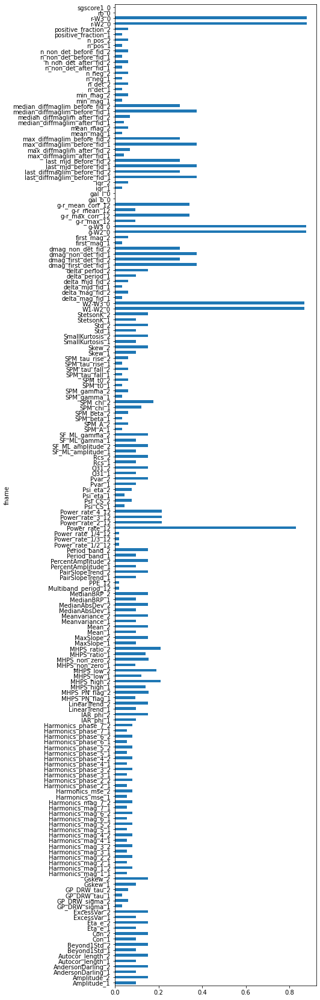

In [120]:
(df.isna().sum() / df.shape[0]).plot.barh(figsize=(6, 30))

### Imputation

Replace by arbitrary value

In [121]:
aux = df.fillna(-99)
aux

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.000000,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,-99.000000,-99.000000,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.000000,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,-99.000000,-99.000000,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.000000,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,-99.000000,-99.000000,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.000000,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,-99.000000,-99.000000,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.000000,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,-99.000000,-99.000000,0.745714,0.995625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.683250,-99.000000,0.677959,-99.000000,1.0,-99.0,0.333333,-99.000000,0.0,-99.000000,...,0.0,-99.0,6.0,-99.0,1.000000,-99.000000,-99.000000,-99.000000,0.725000,0.979375
ZTF21abkndcw,0.617332,-99.000000,0.989514,-99.000000,1.0,-99.0,0.166667,-99.000000,0.0,-99.000000,...,0.0,0.0,1.0,5.0,0.166667,1.000000,1.479431,3.447430,0.827143,0.932292
ZTF21abknlix,0.077879,0.075038,0.520365,0.386736,3.0,1.0,0.416667,0.285714,0.0,0.000000,...,0.0,2.0,12.0,7.0,1.000000,1.000000,5.690223,5.896222,0.777143,1.000000


<AxesSubplot:xlabel='Mean_1', ylabel='Mean_2'>

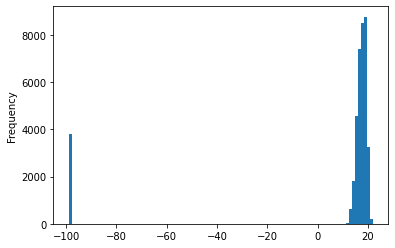

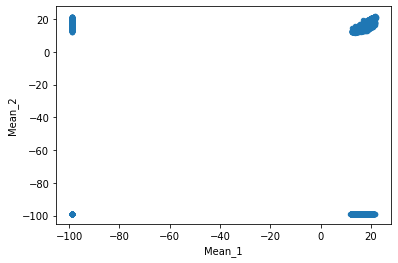

In [122]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

Replace by the median value

In [123]:
aux = df.fillna(df.median())

<AxesSubplot:xlabel='Mean_1', ylabel='Mean_2'>

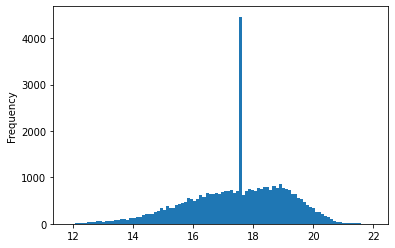

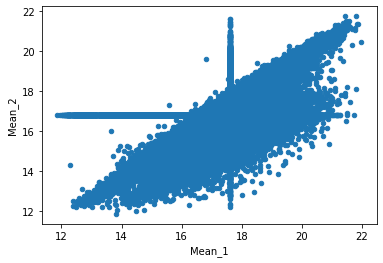

In [124]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

Replace with data sampled from the same dimension

In [125]:
df.Amplitude_1.fillna(pd.Series(index=df[df.Amplitude_1.isna()].index, 
                                data=df.Amplitude_1.dropna().sample(df.Amplitude_1.isna().sum(), replace=True).values))

oid
ZTF17aaaabrg    0.242504
ZTF17aaaabtj    0.294114
ZTF17aaaacml    0.179008
ZTF17aaaacnc    0.199403
ZTF17aaaacnt    0.671062
                  ...   
ZTF21abkjyui    0.683250
ZTF21abkndcw    0.617332
ZTF21abknlix    0.077879
ZTF21abkrimu    0.114365
ZTF21abkylyc    0.311388
Name: Amplitude_1, Length: 39024, dtype: float64

Let's do it column by column

In [126]:
for col in list(df):
    df[col] = df[col].fillna(pd.Series(index=df[df[col].isna()].index, 
                                data=df[col].dropna().sample(df[col].isna().sum(), replace=True).values))

<AxesSubplot:xlabel='Mean_1', ylabel='Mean_2'>

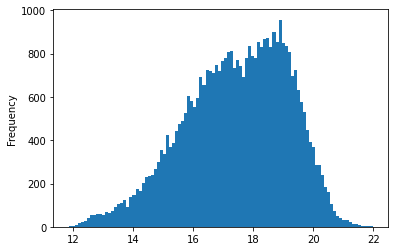

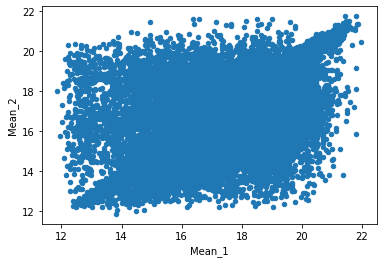

In [127]:
df.Mean_1.plot.hist(bins=100)
df.plot.scatter(x="Mean_1", y="Mean_2")

In [15]:
df

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.000000,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,3.850594,8.423722,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.000000,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,4.150205,11.121169,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.000000,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,7.118218,7.723204,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.000000,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,4.746981,5.347509,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.000000,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,4.420181,3.247880,0.745714,0.995625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.683250,0.461224,0.677959,0.487918,1.0,1.0,0.333333,0.435897,0.0,0.000000,...,0.0,73.0,6.0,16.0,1.000000,0.000000,5.019758,9.795230,0.725000,0.979375
ZTF21abkndcw,0.617332,0.320120,0.989514,0.999943,1.0,1.0,0.166667,0.329268,0.0,0.077922,...,0.0,0.0,1.0,5.0,0.166667,1.000000,1.479431,3.447430,0.827143,0.932292
ZTF21abknlix,0.077879,0.075038,0.520365,0.386736,3.0,1.0,0.416667,0.285714,0.0,0.000000,...,0.0,2.0,12.0,7.0,1.000000,1.000000,5.690223,5.896222,0.777143,1.000000


We will store the sampled version in a new dataframe

In [16]:
df.to_pickle("features_samplenan.pickle")

Let's try again using scikit-learn tools

In [17]:
df = pd.read_pickle("data/features_small.pickle")
df = df.reset_index()
df["fname"] = df.name + "_" + df.fid.astype(str)
df = df.pivot(index="oid", columns=["fname"], values="value")
df

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.000000,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,NaN,NaN,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.000000,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,NaN,NaN,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.000000,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,NaN,NaN,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.000000,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,NaN,NaN,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.000000,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,NaN,NaN,0.745714,0.995625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.683250,NaN,0.677959,NaN,1.0,NaN,0.333333,NaN,0.0,NaN,...,0.0,NaN,6.0,NaN,1.000000,NaN,NaN,NaN,0.725000,0.979375
ZTF21abkndcw,0.617332,NaN,0.989514,NaN,1.0,NaN,0.166667,NaN,0.0,NaN,...,0.0,0.0,1.0,5.0,0.166667,1.000000,1.479431,3.447430,0.827143,0.932292
ZTF21abknlix,0.077879,0.075038,0.520365,0.386736,3.0,1.0,0.416667,0.285714,0.0,0.000000,...,0.0,2.0,12.0,7.0,1.000000,1.000000,5.690223,5.896222,0.777143,1.000000


Let's try scikit learn Simple Imputer instead.
See https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html#sklearn.impute.SimpleImputer

In [18]:
from sklearn.impute import SimpleImputer

In [19]:
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(df)
aux = pd.DataFrame(index=df.index, data=imp.transform(df), columns=list(df))

<AxesSubplot:xlabel='Mean_1', ylabel='Mean_2'>

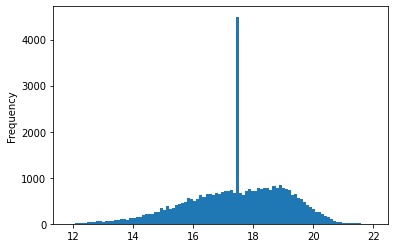

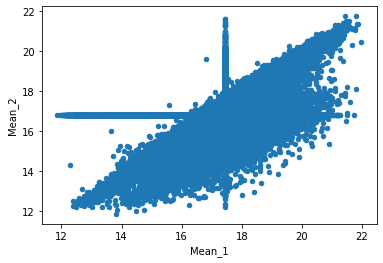

In [20]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

In [21]:
imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp.fit(df)
aux = pd.DataFrame(index=df.index, data=imp.transform(df), columns=list(df))

<AxesSubplot:xlabel='Mean_1', ylabel='Mean_2'>

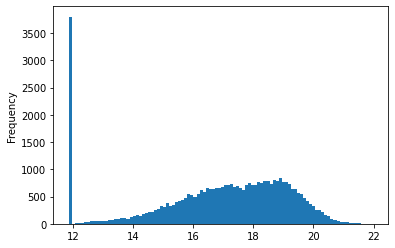

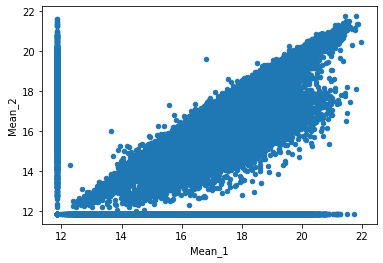

In [22]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

Imputation based on feature correlations (~10 min)

In [23]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0, estimator=KNeighborsRegressor(n_neighbors=15, n_jobs=4))
imp.fit(df)

IterativeImputer(estimator=KNeighborsRegressor(n_jobs=4, n_neighbors=15),
                 random_state=0)

In [24]:
aux = pd.DataFrame(index=df.index, data=imp.transform(df), columns=list(df))

<AxesSubplot:xlabel='Mean_1', ylabel='Mean_2'>

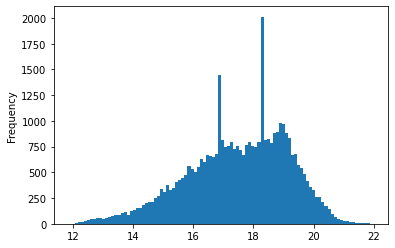

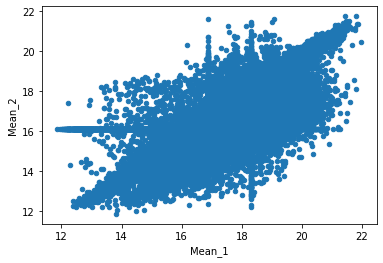

In [25]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

In [26]:
aux.to_pickle("features_itimpnan.pickle")

Nearest neighbor imputer after scaling (~13 min)

In [27]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df)
df_scaled = scaler.transform(df)

In [28]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2, weights="uniform")
imputer.fit(df_scaled)
aux = pd.DataFrame(index=df.index, data=imputer.transform(df_scaled), columns=list(df))

In [29]:
aux = scaler.inverse_transform(df_scaled)

In [30]:
aux = pd.DataFrame(index=df.index, data=aux, columns=list(df))

<AxesSubplot:xlabel='Mean_1', ylabel='Mean_2'>

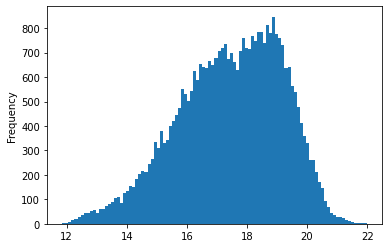

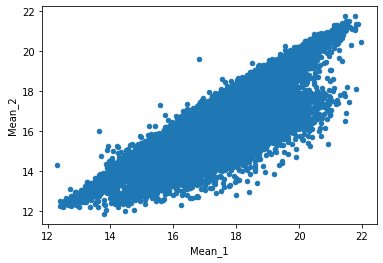

In [31]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

This preserves the correlations much better! This is likely because we scaled the data before doing the imputation.

In [32]:
aux.to_pickle("features_samplekNN.pickle")

Which one to use? It depends on the problem. Usually we want to train a classification model, so we can keep the method that gives the best metrics on the validation set.

## Noisy data

Let's read some astronomical time series (light curves)

In [18]:
import os
lcdir = "data/lcs"

lcs = []
idx = 0
for f in os.listdir(lcdir):
    if f[:2] == "lc":
        idx += 1
        df = pd.read_csv(os.path.join(lcdir, f), sep="\s+", comment="#")
        df["idx"] = idx
        lcs.append(df.set_index("idx"))
lcs = pd.concat(lcs)

In [19]:
lcs.head()

,"index,","field,","ccdid,","qid,","filter,","pid,","infobitssci,","sciinpseeing,","scibckgnd,","scisigpix,",...,"forcediffimsnrap,","aperturecorr,","dnearestrefsrc,","nearestrefmag,","nearestrefmagunc,","nearestrefchi,","nearestrefsharp,","refjdstart,","refjdend,",procstatus
idx,,,,,,,,,,,,,,,,,,,,,
1,0,817,6,0,ZTF_g,448278732015,0,2.4959,163.0480,7.74373,...,-0.195344,1.060408,0.661741,18.989,0.051,3.709,0.228,2.458168e+06,2.458281e+06,0
1,1,817,6,0,ZTF_g,451251202015,0,2.1123,164.0550,12.46500,...,-0.513899,1.041711,0.661741,18.989,0.051,3.709,0.228,2.458168e+06,2.458281e+06,0
1,2,1821,13,0,ZTF_g,452266534815,0,2.5225,216.3450,12.25410,...,0.393701,1.071116,0.638377,18.964,0.051,2.686,0.190,2.458431e+06,2.459538e+06,0
1,3,817,6,0,ZTF_g,452289812015,0,1.7616,165.8160,13.51530,...,-2.227462,1.035749,0.661741,18.989,0.051,3.709,0.228,2.458168e+06,2.458281e+06,0
1,4,817,6,0,ZTF_g,454267652015,1,2.2236,42.3418,29.85700,...,2.025642,1.060141,0.661741,18.989,0.051,3.709,0.228,2.458168e+06,2.458281e+06,0


Fix a problem with the indices

In [20]:
lcs.rename(dict(zip(list(lcs), [i[:-1] for i in list(lcs)])), axis=1, inplace=True)

In [21]:
lcs.head()

,index,field,ccdid,qid,filter,pid,infobitssci,sciinpseeing,scibckgnd,scisigpix,...,forcediffimsnrap,aperturecorr,dnearestrefsrc,nearestrefmag,nearestrefmagunc,nearestrefchi,nearestrefsharp,refjdstart,refjdend,procstatu
idx,,,,,,,,,,,,,,,,,,,,,
1,0,817,6,0,ZTF_g,448278732015,0,2.4959,163.0480,7.74373,...,-0.195344,1.060408,0.661741,18.989,0.051,3.709,0.228,2.458168e+06,2.458281e+06,0
1,1,817,6,0,ZTF_g,451251202015,0,2.1123,164.0550,12.46500,...,-0.513899,1.041711,0.661741,18.989,0.051,3.709,0.228,2.458168e+06,2.458281e+06,0
1,2,1821,13,0,ZTF_g,452266534815,0,2.5225,216.3450,12.25410,...,0.393701,1.071116,0.638377,18.964,0.051,2.686,0.190,2.458431e+06,2.459538e+06,0
1,3,817,6,0,ZTF_g,452289812015,0,1.7616,165.8160,13.51530,...,-2.227462,1.035749,0.661741,18.989,0.051,3.709,0.228,2.458168e+06,2.458281e+06,0
1,4,817,6,0,ZTF_g,454267652015,1,2.2236,42.3418,29.85700,...,2.025642,1.060141,0.661741,18.989,0.051,3.709,0.228,2.458168e+06,2.458281e+06,0


Simplify the names of a few columns

In [22]:
lcs.rename({"forcediffimflux": "flux", "forcediffimfluxunc": "eflux"}, axis=1, inplace=True)

Keep only the important columns

In [23]:
lcs = lcs[["jd", "flux", "eflux"]]

Reset the indices

In [24]:
lcs.reset_index(inplace=True, drop=False)
lcs

,idx,jd,flux,eflux
0,1,2.458203e+06,-18.072833,37.161907
1,1,2.458206e+06,22.960889,54.809803
2,1,2.458207e+06,83.382807,62.783122
3,1,2.458207e+06,-100.646151,49.435529
4,1,2.458209e+06,168.783697,139.078076
...,...,...,...,...
287251,200,2.459464e+06,139.523925,64.629231
287252,200,2.459466e+06,-204.667400,62.758775
287253,200,2.459468e+06,-336.599424,63.761704
287254,200,2.459470e+06,63.915528,53.564095


In [25]:
from astropy.time import Time

Convert Julian date times to times that pandas can understand

In [26]:
lcs.jd.iloc[0]

2458202.7787384

In [27]:
Time(lcs.jd.iloc[0], format='jd', scale='utc').isot

'2018-03-25T06:41:22.998'

In [28]:
lcs["time"] = pd.to_datetime(Time(lcs.jd, format='jd', scale='utc').isot)
lcs.set_index("time", inplace=True)

In [29]:
lcs

,idx,jd,flux,eflux
time,,,,
2018-03-25 06:41:22.998,1,2.458203e+06,-18.072833,37.161907
2018-03-28 06:01:44.000,1,2.458206e+06,22.960889,54.809803
2018-03-29 06:23:49.004,1,2.458207e+06,83.382807,62.783122
2018-03-29 06:57:19.999,1,2.458207e+06,-100.646151,49.435529
2018-03-31 06:25:25.003,1,2.458209e+06,168.783697,139.078076
...,...,...,...,...
2021-09-06 04:33:14.996,200,2.459464e+06,139.523925,64.629231
2021-09-08 04:03:48.004,200,2.459466e+06,-204.667400,62.758775
2021-09-10 03:31:19.001,200,2.459468e+06,-336.599424,63.761704


Let's plot the first object

<ErrorbarContainer object of 3 artists>

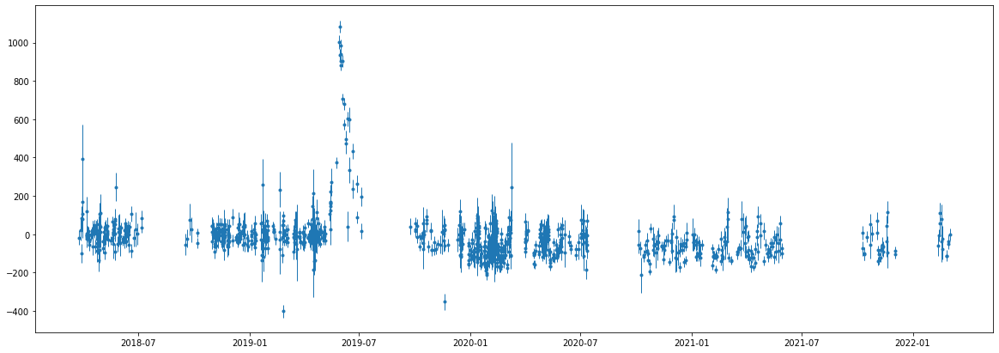

In [30]:
fig, ax = plt.subplots(figsize=(20, 7))
mask = lcs.idx == 1
#ax.scatter(lcs.loc[mask].index, lcs.loc[mask].flux, alpha=1, marker='.')
#ax.plot(lcs.loc[mask].flux, alpha=1, marker='.')
ax.errorbar(lcs.loc[mask].index, lcs.loc[mask].flux, lcs.loc[mask].eflux, alpha=1, marker='.', lw=0, elinewidth=1)

Let's plot all objects!

idx
1      <matplotlib.collections.PathCollection object ...
2      <matplotlib.collections.PathCollection object ...
3      <matplotlib.collections.PathCollection object ...
4      <matplotlib.collections.PathCollection object ...
5      <matplotlib.collections.PathCollection object ...
                             ...                        
196    <matplotlib.collections.PathCollection object ...
197    <matplotlib.collections.PathCollection object ...
198    <matplotlib.collections.PathCollection object ...
199    <matplotlib.collections.PathCollection object ...
200    <matplotlib.collections.PathCollection object ...
Length: 200, dtype: object

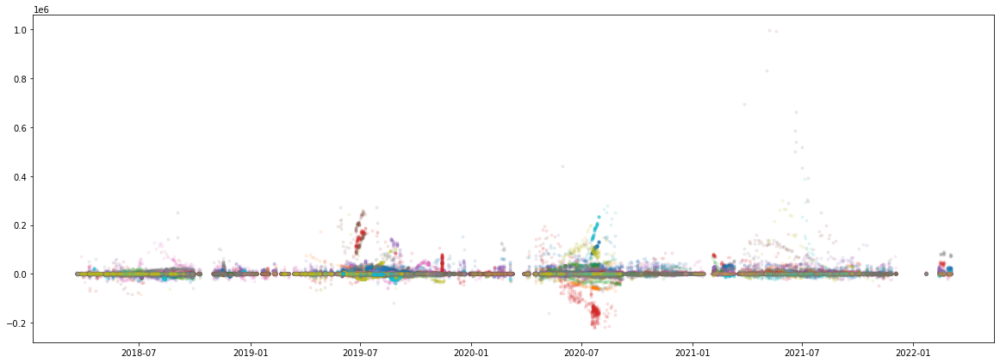

In [31]:
fig, ax = plt.subplots(figsize=(20, 7))
lcs.groupby("idx").apply(lambda df: ax.scatter(df.index, df.flux, alpha=0.1, marker='.'))

The dynamic scale is very large, let's use the arcsinh function to see small and large positive and negative values. We need to define a characteristic noise level, looking at the previous figure we will use a flux of 100.

idx
1      <matplotlib.collections.PathCollection object ...
2      <matplotlib.collections.PathCollection object ...
3      <matplotlib.collections.PathCollection object ...
4      <matplotlib.collections.PathCollection object ...
5      <matplotlib.collections.PathCollection object ...
                             ...                        
196    <matplotlib.collections.PathCollection object ...
197    <matplotlib.collections.PathCollection object ...
198    <matplotlib.collections.PathCollection object ...
199    <matplotlib.collections.PathCollection object ...
200    <matplotlib.collections.PathCollection object ...
Length: 200, dtype: object

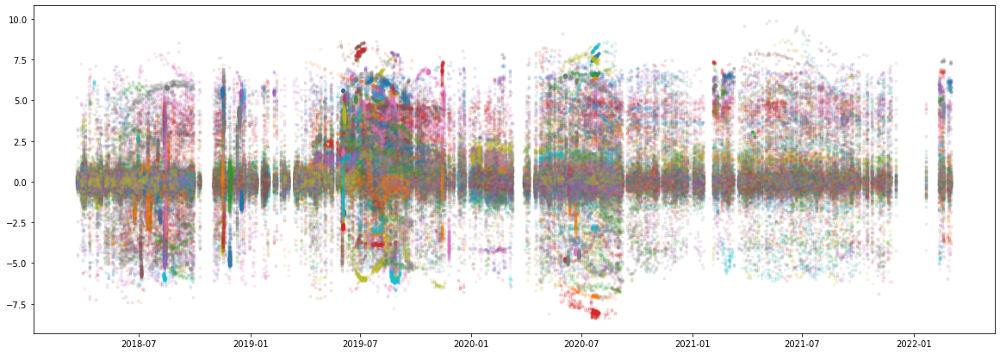

In [32]:
fig, ax = plt.subplots(figsize=(20, 7))
noise = 100
lcs.groupby("idx").apply(lambda df: ax.scatter(df.index, np.arcsinh(df.flux/noise), alpha=0.1, marker='.'))

Let's look at the first object again

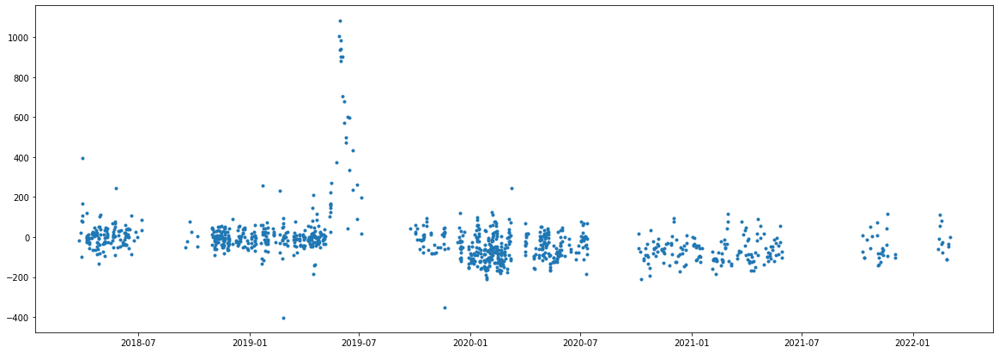

In [33]:
fig, ax = plt.subplots(figsize=(20, 7))
mask = lcs.idx == 1
ax.scatter(lcs.loc[mask].index, lcs.loc[mask].flux, alpha=1, marker='.')

We will save this light curve for later use

In [34]:
lcs.loc[mask].to_pickle("lc_1.pickle")

Let's mean and median filter the time series

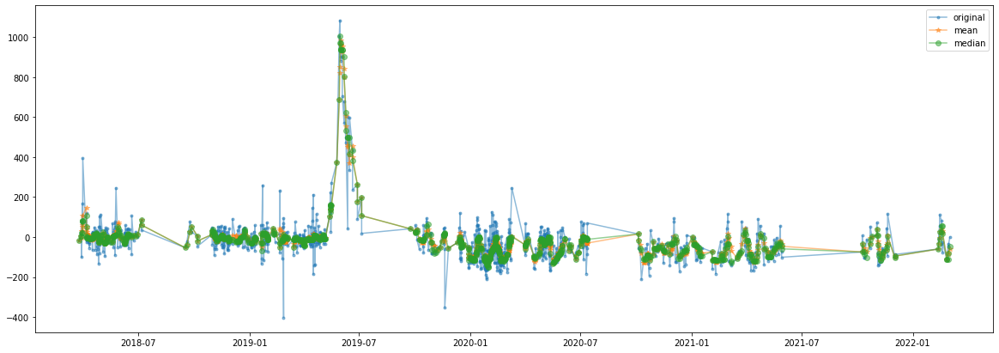

In [36]:
fig, ax = plt.subplots(figsize=(20, 7))
mask = lcs.idx == 1
df = pd.DataFrame(lcs.loc[mask])
ax.plot(df.index, df.flux, alpha=0.5, marker='.', label="original")
ax.plot(df.index, df.flux.rolling('6d').mean(), marker='*', label="mean", alpha=0.5)
ax.plot(df.index, df.flux.rolling('6d').median(), marker='o', label="median", alpha=0.5)
plt.legend()

Now we will use sigma clipping to remove outliers

In [37]:
from astropy.stats import sigma_clip

In [38]:
sigma_clip(df.flux[:10], sigma=1.5, maxiters=10)

masked_array(data=[--, --, 83.3828068664444, --, --, 77.5936132302239,
                   106.975544548965, --, --, 119.955656387898],
             mask=[ True,  True, False,  True,  True, False, False,  True,
                    True, False],
       fill_value=1e+20)

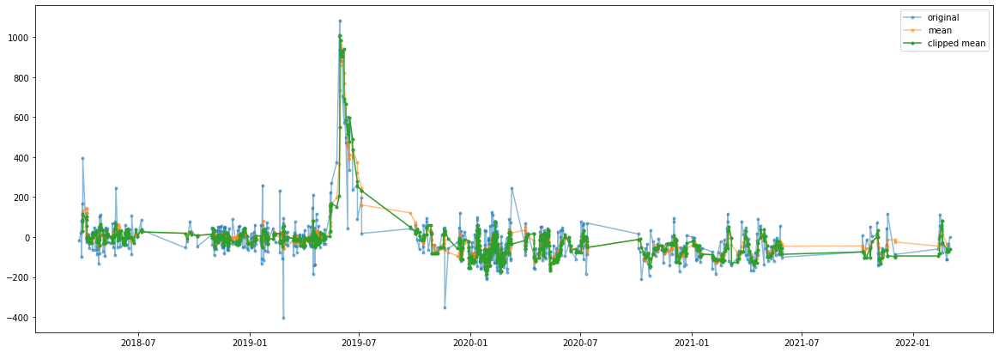

In [39]:
fig, ax = plt.subplots(figsize=(20, 7))
mask = lcs.idx == 1
df = pd.DataFrame(lcs.loc[mask])
ax.plot(df.index, df.flux, alpha=0.5, marker='.', label="original")
ax.plot(df.index, df.flux.rolling(5).mean(), marker='.', label="mean", alpha=0.5)
ax.plot(df.index, df.flux.rolling(5).apply(lambda ys: np.mean(ys[~np.isnan(ys)][
    ~sigma_clip(ys[~np.isnan(ys)], sigma=1.75, maxiters=5, cenfunc='median').mask])), marker='.', label="clipped mean")
plt.legend()

Let's look at the histogram of fluxes

(-200.0, 200.0)

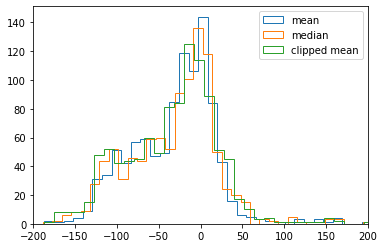

In [40]:
fig, ax = plt.subplots()
ax.hist(df.flux.rolling(5).mean(), label="mean", bins=100, histtype='step');
ax.hist(df.flux.rolling(5).median(), label="median", bins=100, histtype='step');
ax.hist(df.flux.rolling(5).apply(lambda ys: np.mean(ys[~np.isnan(ys)][
    ~sigma_clip(ys[~np.isnan(ys)], sigma=1.75, maxiters=5, cenfunc='median').mask])), bins=100, label="clipped mean", histtype='step');
ax.legend()
ax.set_xlim(-200, 200)

Let's try to see the points that were removed

In [41]:
def dolc(idx):
    maskidx = lcs.idx==idx
    df = lcs.loc[maskidx].dropna()
    clipped = []
    def clip(ys):
        clipped.append(ys[~np.isnan(ys)][~sigma_clip(ys[~np.isnan(ys)], sigma=1.75, maxiters=5, cenfunc='median').mask])
        return clipped[-1].mean()
    cm = df.flux.rolling('6d').apply(lambda ys: clip(ys))

    mask = df.flux.isin(np.unique(np.concatenate(clipped)))

    fig, ax = plt.subplots(figsize=(20, 7))
    ax.errorbar(df.index, df.flux, df.eflux, alpha=1, marker='.', lw=0, elinewidth=1, label="original")
    ax.plot(df.index, cm, alpha=1, label="clipped moving mean", zorder=1000)
    ax.scatter(df.loc[~mask].index, df.loc[~mask].flux, alpha=1, c='r', marker='.', label="outlier", zorder=1000)
    ax.set_ylabel("Flux")
    ax.legend()
    
    fig, ax = plt.subplots()
    ax.scatter(df.flux, df.eflux, marker='.')
    ax.scatter(df.loc[~mask].flux, df.loc[~mask].eflux, c='r', marker='.')
    ax.set_xlabel("Flux")
    ax.set_ylabel("Flux error")
    ax.set_title("Outlier fraction: %.2f" % (np.sum(np.invert(mask)) / mask.shape))
    plt.show()

The right choice of parameters should come from a very detailed modeling of the data or from domain knowledge.

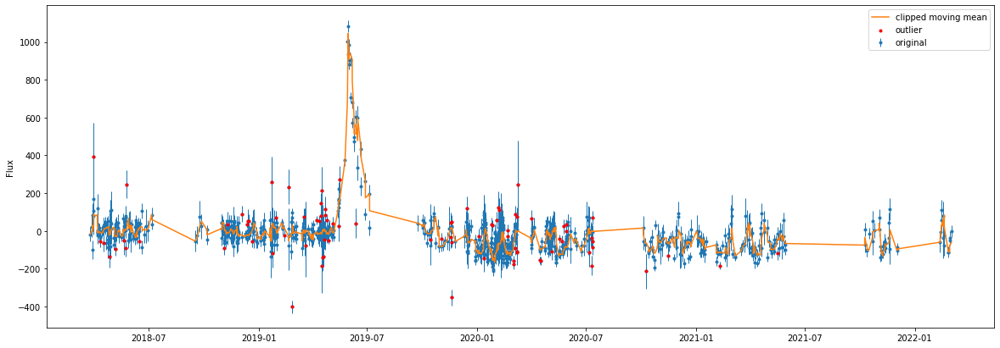

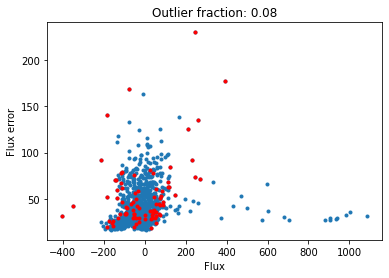

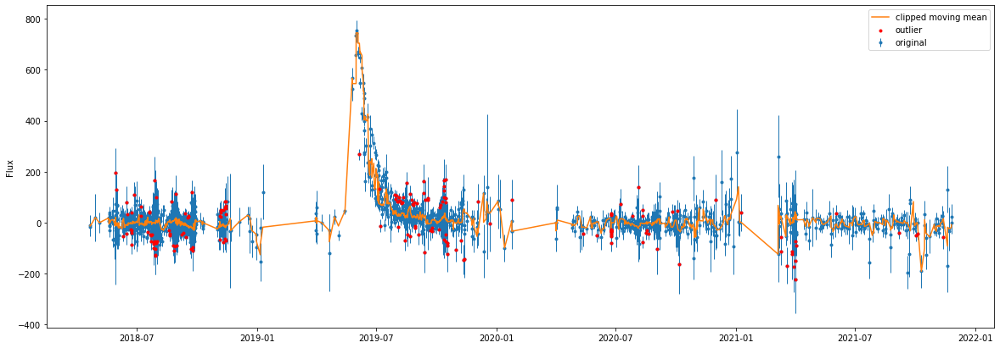

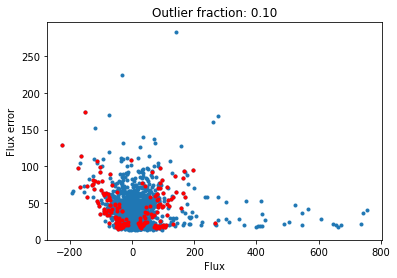

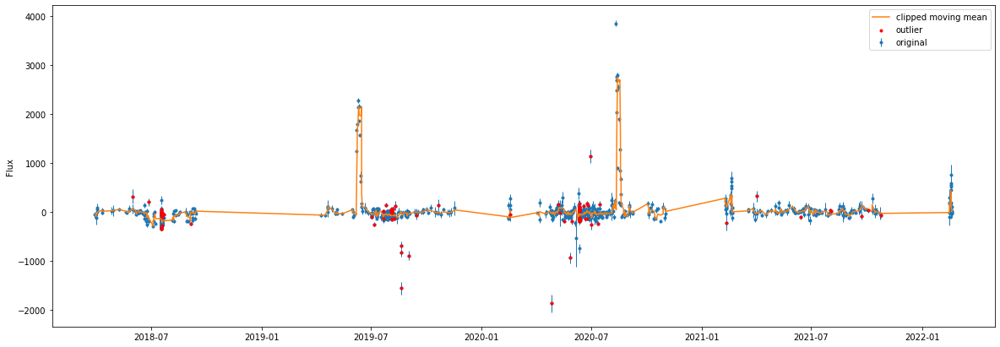

...

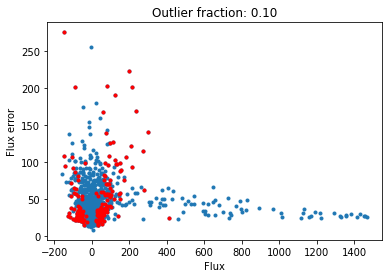

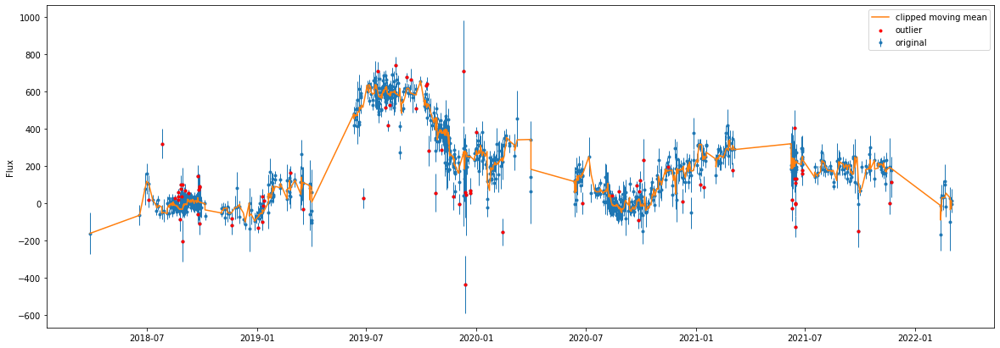

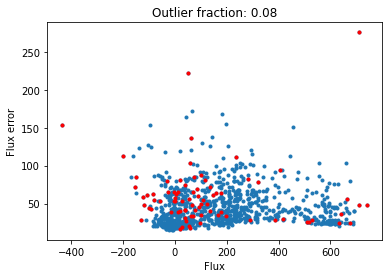

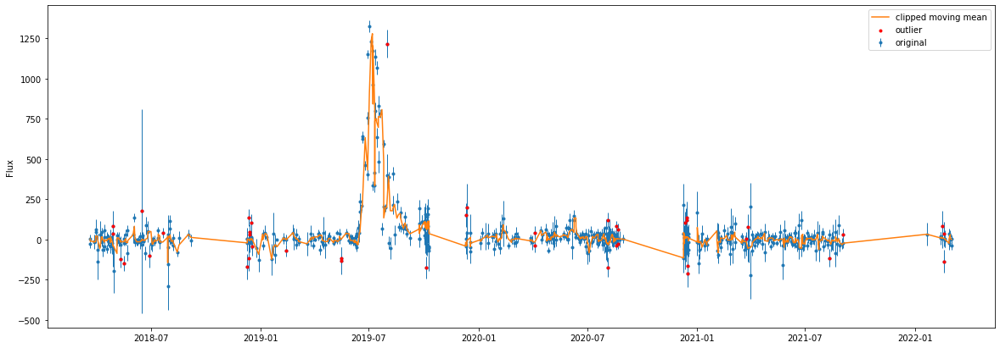

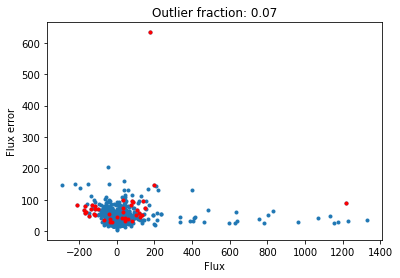

In [42]:
for i in range(20):
    dolc(i+1)

It seems to remove outliers correctly.

Let's try to use the supersmoother from https://github.com/jakevdp/supersmoother

In [43]:
from supersmoother import SuperSmoother, LinearSmoother

In [44]:
modelSS = SuperSmoother()
modelLS = LinearSmoother(0.1)

In [45]:
modelSS.fit(df.jd, df.flux, df.eflux)

In [46]:
modelLS.fit(df.jd, df.flux, df.eflux)

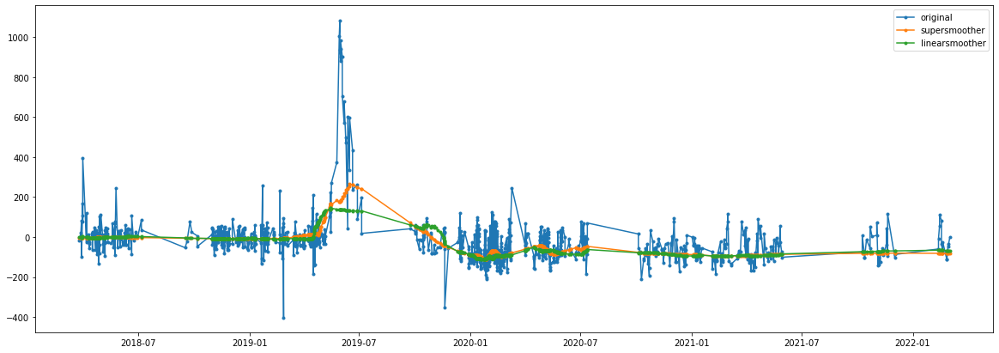

In [47]:
fig, ax = plt.subplots(figsize=(20, 7))
mask = lcs.idx == 1
df = pd.DataFrame(lcs.loc[mask])
ax.plot(df.index, df.flux, alpha=1, marker='.', label="original")
ax.plot(df.index, modelSS.predict(df.jd), marker='.', label="supersmoother")
ax.plot(df.index, modelLS.predict(df.jd), marker='.', label="linearsmoother")
plt.legend()

You can also try LOWESS (LOcally WEighted regreSSion). https://scikit-lego.readthedocs.io/en/latest/linear-models.html

# Data reduction

* Dimensionality reduction
* Numerosity reduction
* Data compression
* Changing the data representation

## Dimensionality reduction

Let's go back to the features dataset. We will open the dataset with imputed values

In [48]:
df = pd.read_pickle("features_itimpnan.pickle")

In [49]:
df

,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.000000,1.000000,1.000000,1.000000,0.426471,0.361446,0.0,0.000000,...,0.000000,0.000000,18.000000,29.000000,0.264706,0.349398,3.832183,5.716850,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.000000,1.000000,1.000000,1.000000,0.489510,0.390909,0.0,0.009259,...,0.000000,1.000000,54.000000,11.000000,0.377622,0.100000,4.151159,5.543293,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.000000,1.000000,1.000000,1.000000,0.403846,0.229508,0.0,0.000000,...,0.000000,2.000000,16.000000,47.000000,0.307692,0.770492,3.640926,5.765992,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.000000,0.999978,1.000000,1.000000,0.062500,0.350000,0.0,0.000000,...,5.000000,3.000000,1.000000,5.000000,0.062500,0.125000,4.445105,5.797905,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.000000,0.775576,1.000000,1.000000,0.242105,0.298246,0.0,0.000000,...,1.000000,1.000000,54.000000,73.000000,0.568421,0.640351,3.832547,4.665547,0.745714,0.995625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.683250,0.164362,0.677959,0.921154,1.000000,1.000000,0.333333,0.266070,0.0,0.000000,...,0.000000,10.066667,6.000000,2.133333,1.000000,0.135847,4.864753,7.349353,0.725000,0.979375
ZTF21abkndcw,0.617332,0.156839,0.989514,0.792166,1.000000,1.133333,0.166667,0.300000,0.0,0.000000,...,0.000000,0.000000,1.000000,5.000000,0.166667,1.000000,1.479431,3.447430,0.827143,0.932292
ZTF21abknlix,0.077879,0.075038,0.520365,0.386736,3.000000,1.000000,0.416667,0.285714,0.0,0.000000,...,0.000000,2.000000,12.000000,7.000000,1.000000,1.000000,5.690223,5.896222,0.777143,1.000000


This is a very large dataset, let's try to visualize it somehow.

Let's get the labels so that we can visualize how well our variables are separated

In [50]:
labels = pd.read_pickle("data/dfcrossmatches_small.pickle")

In [51]:
labels

,classALeRCE,ra,dec,period,source,id_source,class_source,separation_arcsec
oid,,,,,,,,
ZTF18aaveffj,LPV,291.520423,21.930962,NaN,GAIADR2VS,2018953972876187648.0,MIRA_SR,0.067312
ZTF19aauyvnv,LPV,270.298238,-17.722810,NaN,GAIADR2VS,4143774487177066496.0,MIRA_SR,0.062104
ZTF18ablqvvc,RRL,271.180157,-6.556286,NaN,GAIADR2VS,4171403011041441792.0,RRAB,0.095138
ZTF19abiblfd,RRL,268.188213,-17.161156,NaN,GAIADR2VS,4144758786310249984.0,RRAB,0.043913
ZTF18acbvvku,AGN,48.110790,39.274936,NaN,MILLIQUAS,4C 39.11,A,0.055433
...,...,...,...,...,...,...,...,...
ZTF18aawgtde,QSO,235.612689,29.700747,NaN,MILLIQUAS,FBQS J1542+2942,Q,0.384536
ZTF18ablqnie,LPV,260.850159,-23.237702,NaN,GAIADR2VS,4111611813625888768.0,MIRA_SR,0.228594
ZTF19adcftsl,QSO,210.322714,22.715302,NaN,MILLIQUAS,LAMOSTJ140117.45+224255.2,Q,0.067727


In [52]:
labels = labels.loc[labels.index.isin(df.index)].classALeRCE

In [53]:
labels.unique()

array(['LPV', 'RRL', 'AGN', 'QSO', 'EB/EW', 'YSO', 'NLQSO', 'EA',
       'Blazar', 'RSCVn', 'DSCT', 'Ceph', 'SNIa', 'SLSN', 'CV/Nova',
       'SNII', 'Periodic-Other', 'SNIbc', 'SNIIn', 'SNIIb', 'TDE',
       'NLAGN'], dtype=object)

We will drop two labels that are not relevant

In [54]:
mask = labels.isin(['LPV', 'RRL', 'AGN', 'QSO', 'EB/EW', 'YSO', 'EA',
       'Blazar', 'RSCVn', 'DSCT', 'Ceph', 'SNIa', 'SLSN', 'CV/Nova',
       'SNII', 'Periodic-Other', 'SNIbc', 'SNIIn', 'SNIIb', 'TDE'])

In [55]:
df = df.loc[mask]
labels = labels.loc[df.index]

In [56]:
df.shape

(38983, 179)

In [57]:
df.head()

,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.0,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,3.832183,5.716850,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.0,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,4.151159,5.543293,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.0,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,3.640926,5.765992,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.0,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,4.445105,5.797905,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.0,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,3.832547,4.665547,0.745714,0.995625


In [58]:
labels[:5]

oid
ZTF17aaaabrg    EB/EW
ZTF17aaaabtj      RRL
ZTF17aaaacml    EB/EW
ZTF17aaaacnc    RSCVn
ZTF17aaaacnt    EB/EW
Name: classALeRCE, dtype: object

Let's normalize the data

In [59]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df)
df_scaled = scaler.transform(df)

Let's encode the labels
https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html

In [60]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(['SNIbc', 'SNII', 'SNIIn', 'SNIIb', 'SNIa', 'SLSN', 'TDE',
       'CV/Nova', 'AGN', 'QSO', 'Blazar', 'YSO', 
       'DSCT', 'RRL','EB/EW', 'EA', 'Ceph', 'LPV', 'RSCVn', 'Periodic-Other'])
# force given order
le.classes_ = np.array(['SNIbc', 'SNII', 'SNIIn', 'SNIIb', 'SNIa', 'SLSN', 'TDE',
       'CV/Nova', 'AGN', 'QSO', 'Blazar', 'YSO', 
       'DSCT', 'RRL','EB/EW', 'EA', 'Ceph', 'LPV', 'RSCVn', 'Periodic-Other'])
y = le.transform(labels)

In [61]:
le.inverse_transform([y[0]])

array(['EB/EW'], dtype='<U14')

We will try using t-SNe, UMAP and PACMAP

### PCA

In [92]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(df_scaled)
df_pca = pca.transform(df_scaled)

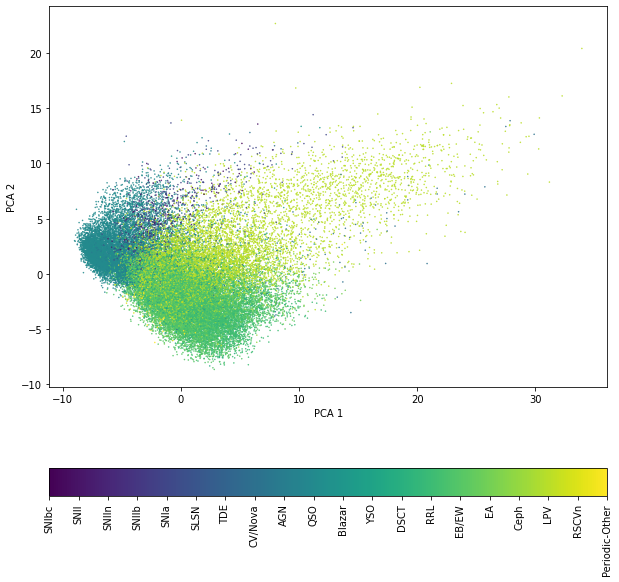

In [93]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_pca[:, 0], df_pca[:, 1], c=np.array(y), marker='.', s=1)
ax.set_xlabel("PCA 1")
ax.set_ylabel("PCA 2")
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90)
plt.show()

### NMF

Non negative matrix factorization requires positive values only, so we use the quantile transform

In [94]:
from sklearn.preprocessing import QuantileTransformer
qt = QuantileTransformer()
qt.fit(df)
df_qt = qt.transform(df)

In [95]:
from sklearn.decomposition import NMF
nmf = NMF(n_components=2)
nmf.fit(df_qt)
df_nmf = nmf.transform(df_qt)

/home/fforster/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


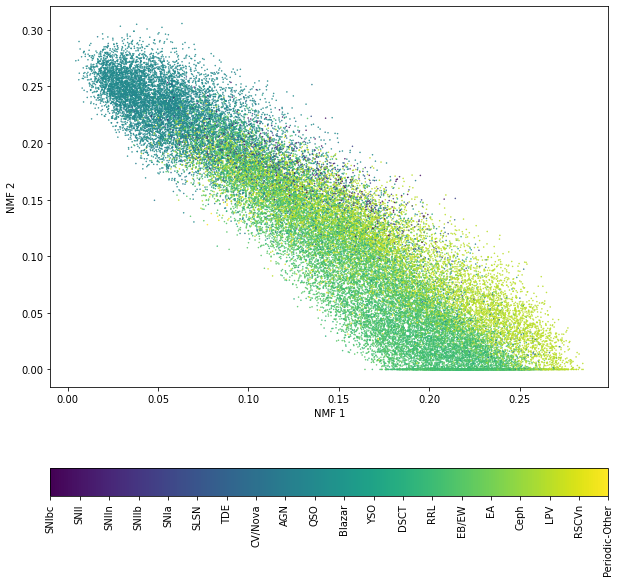

In [96]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_nmf[:, 0], df_nmf[:, 1], c=np.array(y), marker='.', s=1)
ax.set_xlabel("NMF 1")
ax.set_ylabel("NMF 2")
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90)
plt.show()

### t-SNE

Let's try t-SNe with 10 k objects (45 s)

In [97]:
from sklearn.manifold import TSNE

In [98]:
tsne_model = TSNE(n_components = 2, init = 'pca', perplexity = 25)
df_tsne = tsne_model.fit_transform(df_scaled[:10000])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


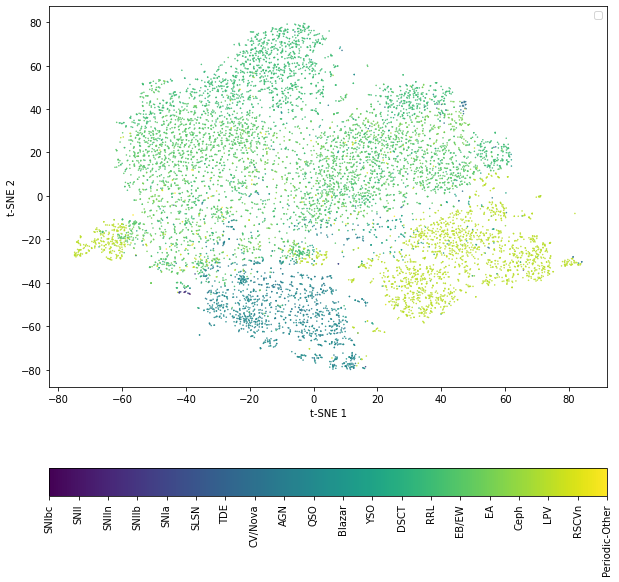

In [99]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_tsne[:, 0], df_tsne[:, 1], c=np.array(y[:10000]), marker='.', s=1)
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90)
plt.show()

### UMAP

37 s for the full sample

In [100]:
import umap
reducer = umap.UMAP()

df_umap = reducer.fit_transform(df_scaled)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
<ipython-input-101-ce2fd4620237>:6: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(cax, orientation='horizontal')


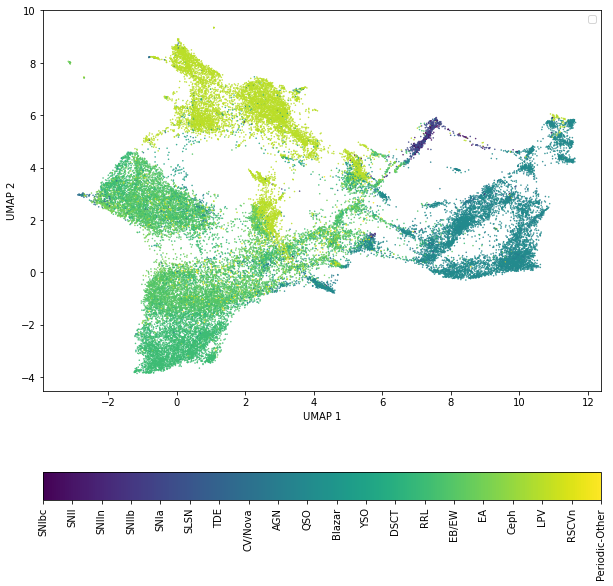

In [101]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
ax.scatter(df_umap[:, 0], df_umap[:, 1], c=y, marker='.', s=1)
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90)
plt.show()

### PACMAP

~50 s for the full sample

In [102]:
import pacmap

In [103]:
embedding = pacmap.PaCMAP(n_dims=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=4.0)
df_pacmap = embedding.fit_transform(df_scaled, init="pca")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
<ipython-input-104-2a1c15fd718c>:6: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(cax, orientation='horizontal')


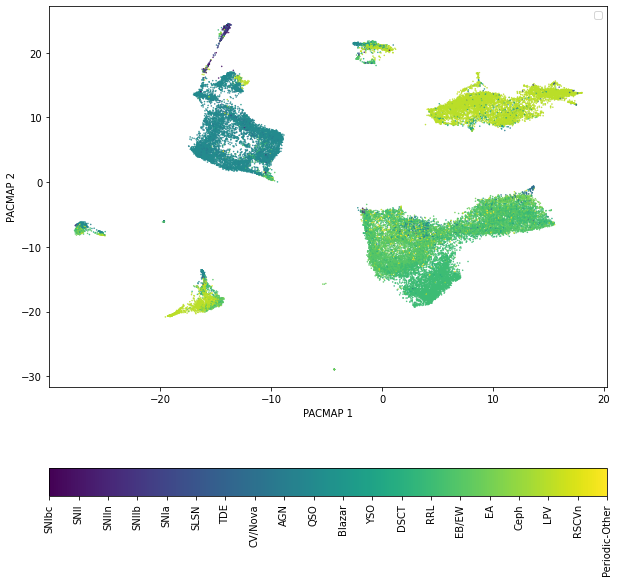

In [104]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
ax.scatter(df_pacmap[:, 0], df_pacmap[:, 1], c=y, marker = ".", s=1)
ax.set_xlabel("PACMAP 1")
ax.set_ylabel("PACMAP 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max() + 1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max() + 1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90)
plt.show()

What would happen if we don't use a scaled df?

In [105]:
df_pacmap = embedding.fit_transform(df, init="pca")

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

What if we use a different normalization?

In [106]:
from sklearn.preprocessing import QuantileTransformer
scaler = QuantileTransformer()
scaler.fit(df)
df_scaled = scaler.transform(df)

~40 s

In [107]:
df_pacmap = embedding.fit_transform(df_scaled, init="pca")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
<ipython-input-108-2a1c15fd718c>:6: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  cbar = plt.colorbar(cax, orientation='horizontal')


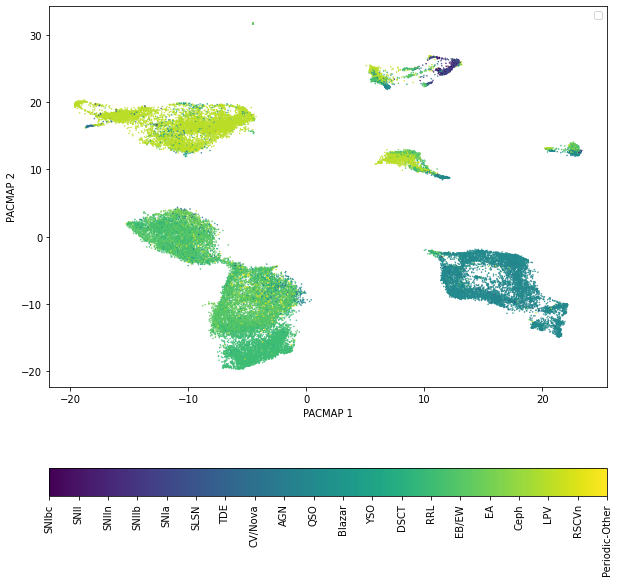

In [108]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
ax.scatter(df_pacmap[:, 0], df_pacmap[:, 1], c=y, marker = ".", s=1)
ax.set_xlabel("PACMAP 1")
ax.set_ylabel("PACMAP 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max() + 1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max() + 1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90)
plt.show()

If you want to use these transformations with new data, you would need to learn the transformation from the distribution of the training data and store it. See examples here https://umap-learn.readthedocs.io/en/latest/transform.html

# Data transformation

* Smoothing
* Aggregation
* Discretization
* Balancing
* Data augmentation

## Discretization

We can use the qcut function from pandas

<AxesSubplot:ylabel='Frequency'>

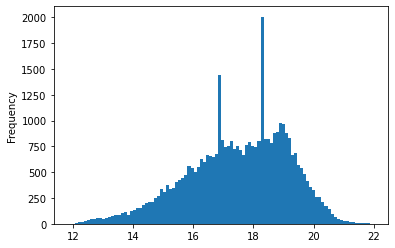

In [62]:
df.Mean_1.plot.hist(bins=100)

In [63]:
cats, bins = pd.qcut(df.Mean_1, q=5, retbins=True)

In [64]:
cats

oid
ZTF17aaaabrg                  (17.152, 18.2]
ZTF17aaaabtj                (16.073, 17.152]
ZTF17aaaacml                  (17.152, 18.2]
ZTF17aaaacnc                  (17.152, 18.2]
ZTF17aaaacnt                  (17.152, 18.2]
                            ...             
ZTF21abkjyui    (11.854000000000001, 16.073]
ZTF21abkndcw                (16.073, 17.152]
ZTF21abknlix                (16.073, 17.152]
ZTF21abkrimu                  (18.2, 18.984]
ZTF21abkylyc                  (18.2, 18.984]
Name: Mean_1, Length: 38983, dtype: category
Categories (5, interval[float64]): [(11.854000000000001, 16.073] < (16.073, 17.152] < (17.152, 18.2] < (18.2, 18.984] < (18.984, 21.984]]

In [65]:
bins

array([11.85527722, 16.07262068, 17.15205097, 18.20015148, 18.98446573,
       21.98388786])

In [66]:
aux = pd.qcut(df.Mean_1, q=5, labels=False)

<AxesSubplot:>

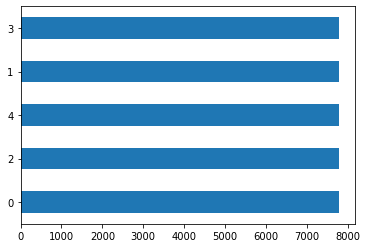

In [67]:
aux.value_counts().plot.barh()

## Spatial transformations

* rotations
* flips
* stretch
* change of resolution
* multi scale representation

![](images/multiscale.png)

![](images/CNN.png)

Förster et al, submitted (https://github.com/fforster/delight)

## Temporal transformations

We can apply many transformation to temporal data, e.g. day of the week, hour of the day, etc...

In [68]:
lc = pd.DataFrame(index=pd.date_range(start='20220330', periods=10000, freq='1min'), data=range(10000), columns=["val"])

In [69]:
lc

,val
2022-03-30 00:00:00,0
2022-03-30 00:01:00,1
2022-03-30 00:02:00,2
2022-03-30 00:03:00,3
2022-03-30 00:04:00,4
...,...
2022-04-05 22:35:00,9995
2022-04-05 22:36:00,9996
2022-04-05 22:37:00,9997
2022-04-05 22:38:00,9998


In [70]:
lc.index.day

Int64Index([30, 30, 30, 30, 30, 30, 30, 30, 30, 30,
            ...
             5,  5,  5,  5,  5,  5,  5,  5,  5,  5],
           dtype='int64', length=10000)

In [71]:
lc.index.hour

Int64Index([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
            ...
            22, 22, 22, 22, 22, 22, 22, 22, 22, 22],
           dtype='int64', length=10000)

In [72]:
lc.index.weekdayy = le.transform(labels)

Int64Index([2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
            ...
            1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
           dtype='int64', length=10000)

In [73]:
lc.index.second

Int64Index([0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
            ...
            0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
           dtype='int64', length=10000)

<AxesSubplot:>

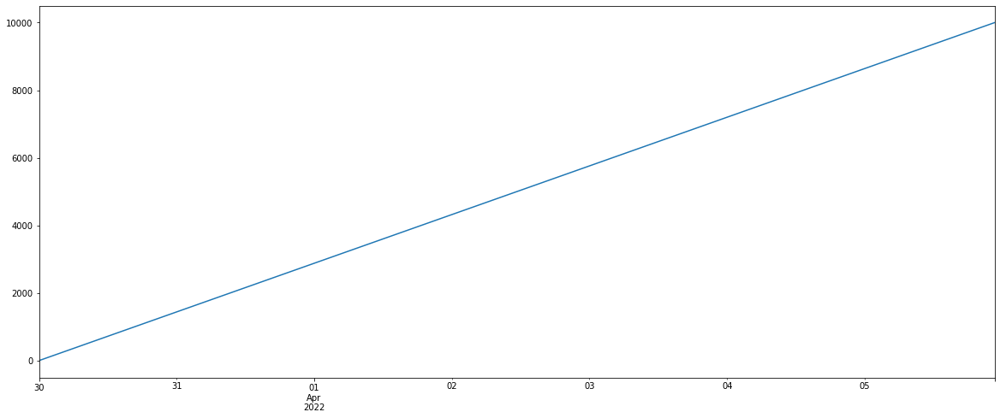

In [74]:
fig, ax = plt.subplots(figsize=(20, 8))
lc.val.plot(ax=ax)

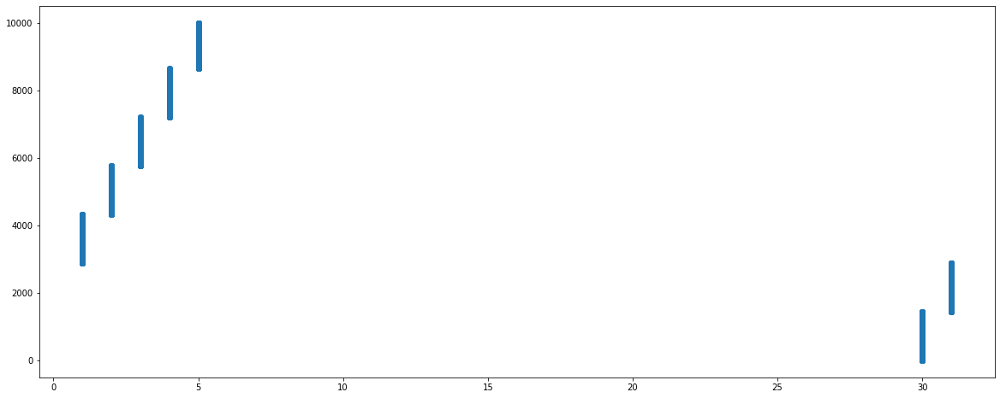

In [75]:
fig, ax = plt.subplots(figsize=(20, 8))
ax.scatter(lc.index.day, lc.val)

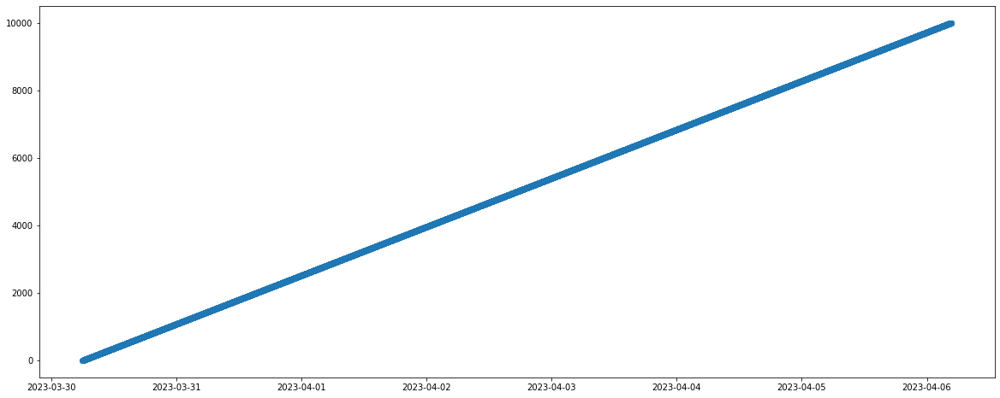

In [76]:
fig, ax = plt.subplots(figsize=(20, 8))
ax.scatter(lc.index + pd.Timedelta(365.25, unit="days"), lc.val)

In [77]:
dt = lc.index.hour + (lc.index.minute + lc.index.second / 60.) / 60.

Sometimes it may be convenient to add a variable that encodes the periodicity of the data in a continuous fashion, e.g. taking sin and cos of the hour of the day to represent time.

In [78]:
lc["sint"] = np.sin(dt * np.pi / 12.)
lc["cost"] = np.cos(dt * np.pi / 12.)

In [79]:
lc

,val,sint,cost
2022-03-30 00:00:00,0,0.000000,1.000000
2022-03-30 00:01:00,1,0.004363,0.999990
2022-03-30 00:02:00,2,0.008727,0.999962
2022-03-30 00:03:00,3,0.013090,0.999914
2022-03-30 00:04:00,4,0.017452,0.999848
...,...,...,...
2022-04-05 22:35:00,9995,-0.362438,0.932008
2022-04-05 22:36:00,9996,-0.358368,0.933580
2022-04-05 22:37:00,9997,-0.354291,0.935135
2022-04-05 22:38:00,9998,-0.350207,0.936672


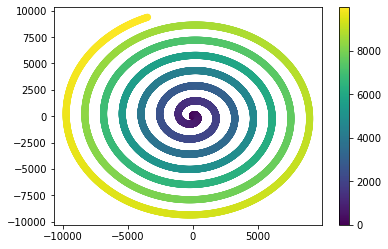

In [80]:
fig, ax = plt.subplots()
cax=ax.scatter(lc.val * lc.sint, lc.val * lc.cost, c=lc.val)
fig.colorbar(cax)

You can see a smooth transition from day to day

## Feature extraction

A very important transformation of the data is feature extraction. There are different types of features that can be used. Some of them are:

* Simple statistics based on data
* Domain specific statistics based on data
* Additional contextual information or external information

Here we will use the tsfresh library to extract features from time series. Let's go back to our light curvesdataframe.

In [81]:
lcs

,idx,jd,flux,eflux
time,,,,
2018-03-25 06:41:22.998,1,2.458203e+06,-18.072833,37.161907
2018-03-28 06:01:44.000,1,2.458206e+06,22.960889,54.809803
2018-03-29 06:23:49.004,1,2.458207e+06,83.382807,62.783122
2018-03-29 06:57:19.999,1,2.458207e+06,-100.646151,49.435529
2018-03-31 06:25:25.003,1,2.458209e+06,168.783697,139.078076
...,...,...,...,...
2021-09-06 04:33:14.996,200,2.459464e+06,139.523925,64.629231
2021-09-08 04:03:48.004,200,2.459466e+06,-204.667400,62.758775
2021-09-10 03:31:19.001,200,2.459468e+06,-336.599424,63.761704


In [84]:
from tsfresh import extract_features

In [85]:
lcs_aux = pd.DataFrame(lcs)

In [88]:
lcs_aux = lcs_aux.reset_index(drop=True)[["idx", "jd", "flux"]]

In [90]:
lcs_aux.jd = lcs_aux.jd - lcs_aux.jd.min()
lcs_aux.rename({"jd": "time"}, axis=1, inplace=True)
lcs_aux

,idx,time,flux
0,1,5.001724,-18.072833
1,1,7.974190,22.960889
2,1,8.989525,83.382807
3,1,9.012801,-100.646151
4,1,10.990637,168.783697
...,...,...,...
287251,200,1265.912743,139.523925
287252,200,1267.892292,-204.667400
287253,200,1269.869734,-336.599424
287254,200,1271.871713,63.915528


In [94]:
lcs_aux.dropna(inplace=True)

Now we will extract the features using the tsfresh library

In [95]:
extracted_features = extract_features(lcs_aux, column_id="idx", column_sort="time")


Feature Extraction: 100%|██████████| 20/20 [02:50<00:00,  8.52s/it]


In [98]:
extracted_features

,flux__variance_larger_than_standard_deviation,flux__has_duplicate_max,flux__has_duplicate_min,flux__has_duplicate,flux__sum_values,flux__abs_energy,flux__mean_abs_change,flux__mean_change,flux__mean_second_derivative_central,flux__median,...,flux__permutation_entropy__dimension_6__tau_1,flux__permutation_entropy__dimension_7__tau_1,flux__query_similarity_count__query_None__threshold_0.0,"flux__matrix_profile__feature_""min""__threshold_0.98","flux__matrix_profile__feature_""max""__threshold_0.98","flux__matrix_profile__feature_""mean""__threshold_0.98","flux__matrix_profile__feature_""median""__threshold_0.98","flux__matrix_profile__feature_""25""__threshold_0.98","flux__matrix_profile__feature_""75""__threshold_0.98",flux__mean_n_absolute_max__number_of_maxima_7
1,1.0,0.0,0.0,0.0,-1.859300e+04,1.654948e+07,57.947645,0.017443,0.003457,-25.642088,...,6.182680,6.799647,NaN,0.751556,2.278162,1.599997,1.603120,1.416307,1.785991,964.901058
2,1.0,0.0,0.0,0.0,2.475510e+04,1.184171e+07,44.135310,0.020613,0.008326,2.876646,...,6.356004,7.227547,NaN,0.688734,2.090583,1.537634,1.557632,1.393091,1.698210,695.930275
3,1.0,0.0,0.0,0.0,-4.201640e+04,1.250537e+08,99.984743,0.050126,0.029827,-60.419930,...,6.199092,6.887582,NaN,1.071372,4.253103,3.271171,3.449497,3.055087,3.688209,2772.841496
4,1.0,0.0,0.0,0.0,1.125421e+04,1.059302e+07,66.554635,-0.172491,0.098857,-1.683267,...,5.504235,5.744373,NaN,1.036882,2.618459,1.859505,1.885614,1.639227,2.105365,963.922084
5,1.0,0.0,0.0,0.0,7.942089e+04,2.457187e+08,295.651943,-1.641084,-2.239365,-25.442667,...,5.186372,5.481893,NaN,1.134646,3.540812,2.557592,2.587681,2.207235,2.912339,2376.580512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,1.0,0.0,0.0,0.0,2.013198e+06,3.738995e+11,937.598039,0.046755,0.005670,-11.721203,...,6.219773,6.939760,NaN,0.779234,2.229666,1.604364,1.618364,1.442240,1.795205,213096.137666
197,1.0,0.0,0.0,0.0,6.000620e+04,1.090375e+07,82.564255,0.003577,0.031024,86.776244,...,5.926999,6.367610,NaN,0.956248,2.393603,1.753093,1.760514,1.592256,1.931547,421.591542
198,1.0,0.0,0.0,0.0,-4.627796e+06,7.051516e+10,2078.564614,0.276193,-0.053096,-136.454457,...,6.390203,7.683499,NaN,0.999678,4.695560,3.564263,3.676839,3.316772,3.959982,23160.981353
199,1.0,0.0,0.0,0.0,2.095696e+04,1.020500e+07,46.411190,-0.007070,0.001047,8.932840,...,6.370065,7.293031,NaN,0.977145,3.367105,2.721446,2.789034,2.571521,2.951761,581.192340


We will do some feature selection to investigate which features are more useful. A simple way is to look at the distribution of features and check whether they have some discriminative power by doing Kolmogorov-Smirnov tests, but this only looks at one dimensional distributions of the data. A slightly more involved method that takes into account the correlations is to build a random forest classifier and look at the feature importances. 

## Balancing

A very important problem in classification is balancing. Even if you use a weighting scheme during training, balancing the data will be key to get a reasonable answer. Let's look at our previous sample.

<AxesSubplot:>

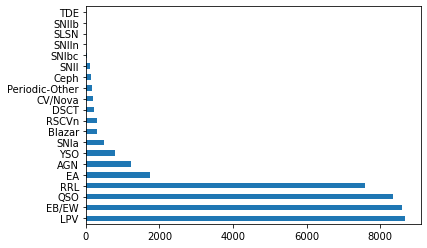

In [500]:
labels.value_counts().plot.barh()

A way of balancing the data set is to create new data from the data itself, this is called data augmentation.

## Data augmentation

In [501]:
df = pd.read_pickle("features_itimpnan.pickle")
labels = pd.read_pickle("data/dfcrossmatches_small.pickle")

In [502]:
labels = labels.loc[labels.index.isin(df.index)].classALeRCE
mask = labels.isin(['LPV', 'RRL', 'AGN', 'QSO', 'EB/EW', 'YSO', 'EA',
       'Blazar', 'RSCVn', 'DSCT', 'Ceph', 'SNIa', 'CV/Nova',
       'SNII', 'Periodic-Other', 'SNIbc'])
df = df.loc[mask]
labels = labels.loc[df.index]
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(['SNIbc', 'SNII', 'SNIa',
       'CV/Nova', 'AGN', 'QSO', 'Blazar', 'YSO', 
       'DSCT', 'RRL','EB/EW', 'EA', 'Ceph', 'LPV', 'RSCVn', 'Periodic-Other'])
# force given order
le.classes_ = np.array(['SNIbc', 'SNII', 'SNIa',
       'CV/Nova', 'AGN', 'QSO', 'Blazar', 'YSO', 
       'DSCT', 'RRL','EB/EW', 'EA', 'Ceph', 'LPV', 'RSCVn', 'Periodic-Other'])
y = le.transform(labels)

In [503]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df)
df_scaled = scaler.transform(df)

In [505]:
labels.value_counts()

LPV               8664
EB/EW             8600
QSO               8348
RRL               7592
EA                1754
AGN               1235
YSO                805
SNIa               504
Blazar             300
RSCVn              295
DSCT               210
CV/Nova            198
Periodic-Other     166
Ceph               134
SNII               106
SNIbc               40
Name: classALeRCE, dtype: int64

In [506]:
np.unique(y, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 array([  40,  106,  504,  198, 1235, 8348,  300,  805,  210, 7592, 8600,
        1754,  134, 8664,  295,  166]))

We will oversample the less frequent classes in order to get a more balanced training set.

**WARNING**: You need to do this **after** creating your training, validation and test sets.

### SMOTE

In [507]:
from imblearn.over_sampling import SMOTE

~3 s

In [508]:
X_resampled, y_resampled = SMOTE().fit_resample(df_scaled, y)

In [509]:
aux = pd.DataFrame(data=X_resampled, columns=list(df))
auxy = y_resampled

0
8664


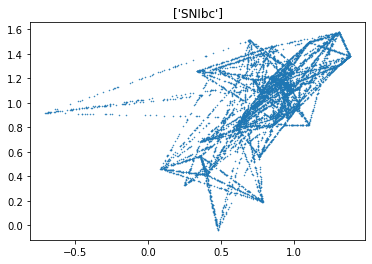

1
8664


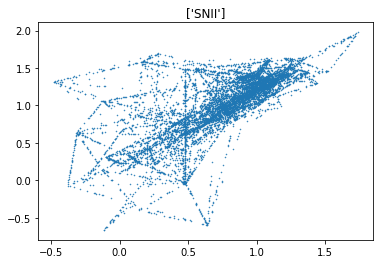

2
8664


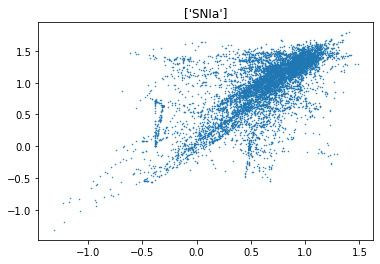

3
8664


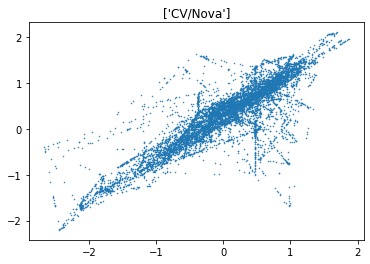

4
8664


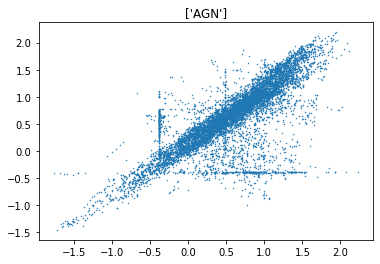

5
8664


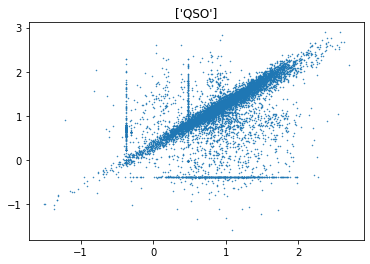

6
8664


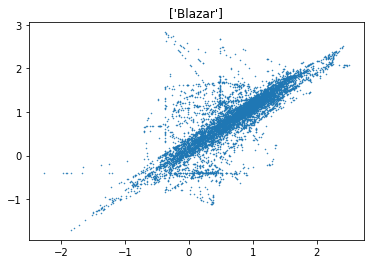

7
8664


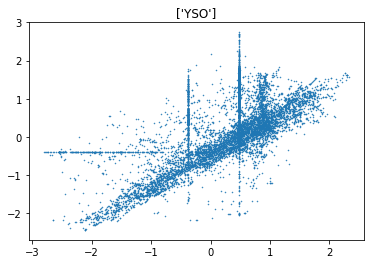

8
8664


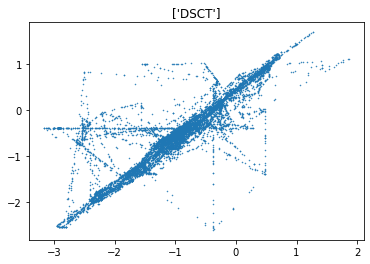

9
8664


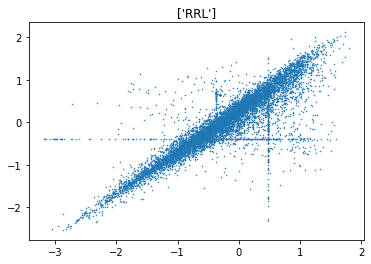

10
8664


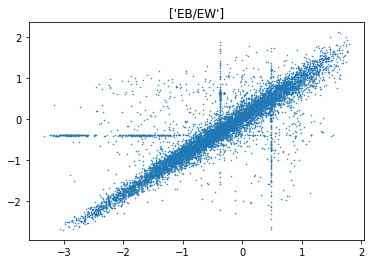

11
8664


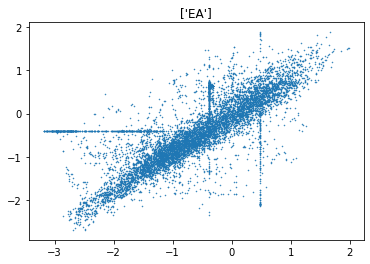

12
8664


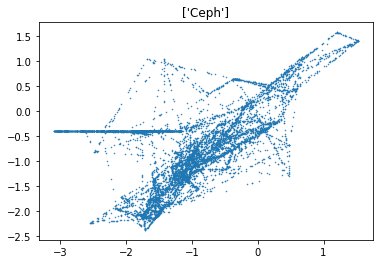

13
8664


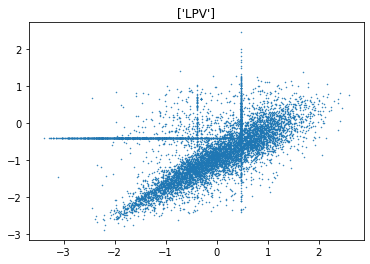

14
8664


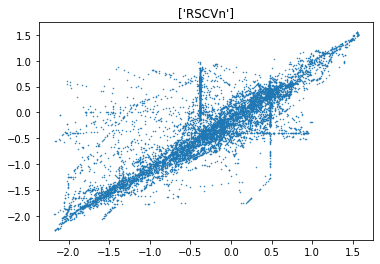

15
8664


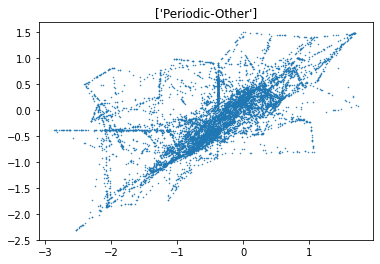

In [90]:
for yi in np.unique(auxy):
    print(yi)
    fig, ax = plt.subplots()
    mask = auxy == yi
    print(mask.sum())
    ax.scatter(aux.iloc[mask].Mean_1, aux.iloc[mask].Mean_2, marker='.', s=1)
    ax.set_title(le.inverse_transform([yi]))
    plt.show()

<AxesSubplot:>

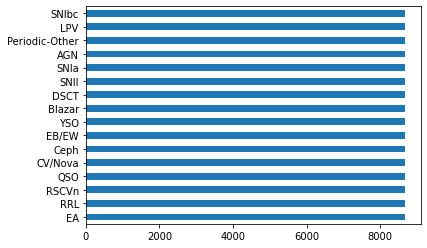

In [510]:
pd.Series(le.inverse_transform(y_resampled)).value_counts().plot.barh()

### SVMSMOTE

https://ir.lib.hiroshima-u.ac.jp/files/public/2/28413/20141016164340528778/A1005.pdf

In [74]:
from imblearn.over_sampling import SVMSMOTE

~18 min!!

In [75]:
X_resampled, y_resampled = SVMSMOTE().fit_resample(df_scaled, y)

In [76]:
aux = pd.DataFrame(data=X_resampled, columns=list(df))
auxy = y_resampled

0
2477


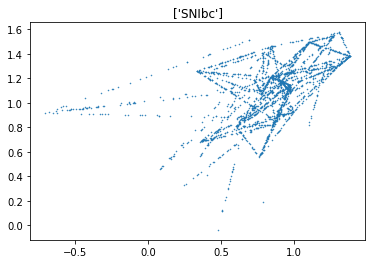

1
8664


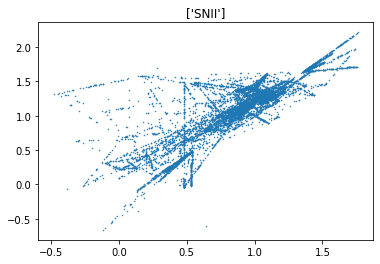

2
8664


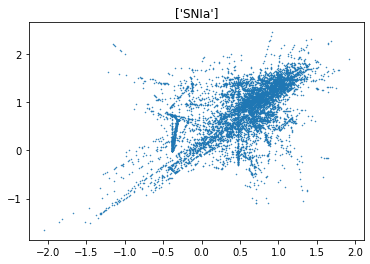

3
8664


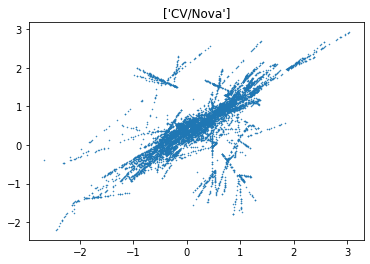

4
8664


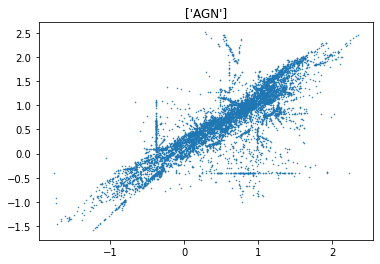

5
8664


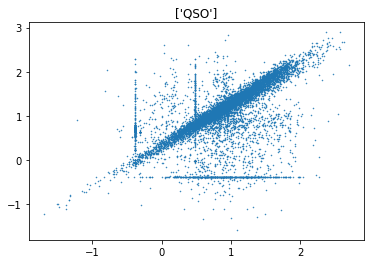

6
6656


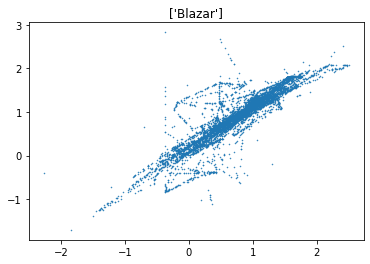

7
8664


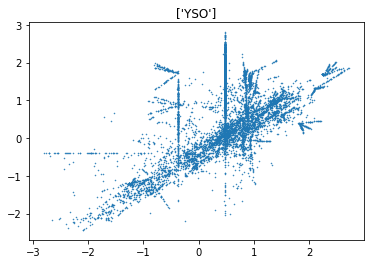

8
4390


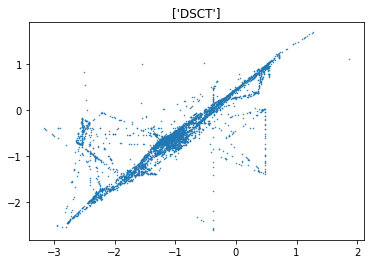

9
8664


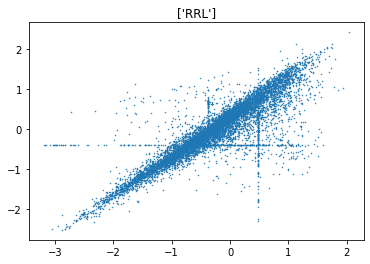

10
8664


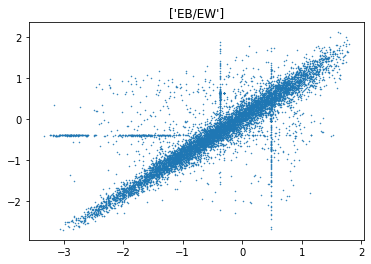

11
8664


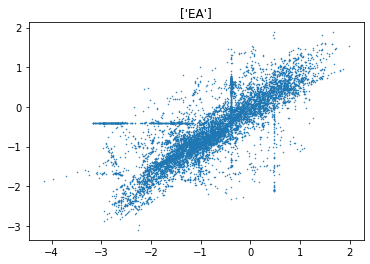

12
3863


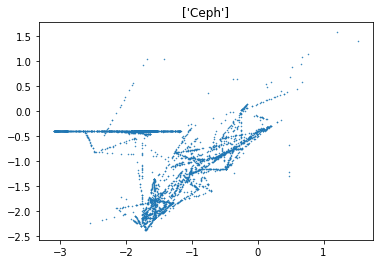

13
8664


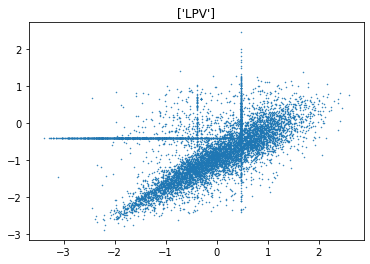

14
3879


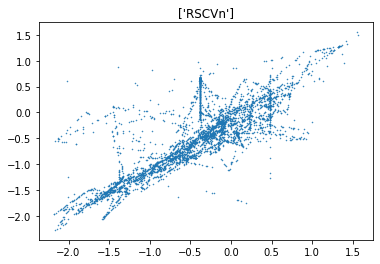

15
3612


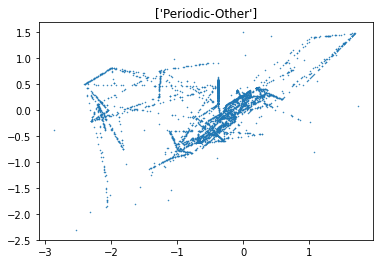

In [77]:
for yi in np.unique(auxy):
    print(yi)
    fig, ax = plt.subplots()
    mask = auxy == yi
    print(mask.sum())
    ax.scatter(aux.iloc[mask].Mean_1, aux.iloc[mask].Mean_2, marker='.', s=1)
    ax.set_title(le.inverse_transform([yi]))
    plt.show()

<AxesSubplot:>

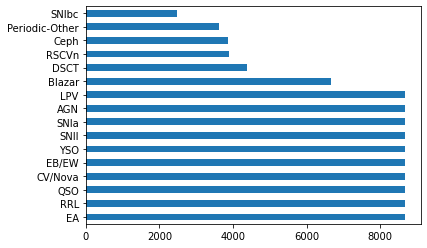

In [86]:
pd.Series(le.inverse_transform(y_resampled)).value_counts().plot.barh()

### Image data augmentation

![](images/cat.png)

![](images/galaxies.png)

https://benanne.github.io/2014/04/05/galaxy-zoo.html

### Time series data augmentation

![](images/lc.jpg)

Fons et al. 2020

https://arxiv.org/abs/2010.15111

### Gaussian Process interpolation

![](images/GP.png)

In [511]:
lc = pd.read_pickle("lc_1.pickle")
lc

,idx,jd,flux,eflux
time,,,,
2018-03-25 06:41:22.998,1,2.458203e+06,-18.072833,37.161907
2018-03-28 06:01:44.000,1,2.458206e+06,22.960889,54.809803
2018-03-29 06:23:49.004,1,2.458207e+06,83.382807,62.783122
2018-03-29 06:57:19.999,1,2.458207e+06,-100.646151,49.435529
2018-03-31 06:25:25.003,1,2.458209e+06,168.783697,139.078076
...,...,...,...,...
2022-02-26 05:14:10.000,1,2.459637e+06,-111.403781,24.626755
2022-02-26 09:42:23.996,1,2.459637e+06,-111.649475,29.432567
2022-02-28 09:21:57.004,1,2.459639e+06,-35.204788,32.284977


<AxesSubplot:ylabel='Frequency'>

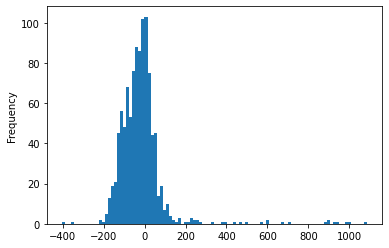

In [375]:
lc.flux.plot.hist(bins=100)

In [512]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel
X = np.array(lc.jd - lc.jd.min())[:, np.newaxis]
y = np.array(lc.flux, np.newaxis)[:, np.newaxis]
kernel = 1.0 * RBF(length_scale=10, length_scale_bounds=(1, 1e3)) + \
    WhiteKernel(noise_level=20, noise_level_bounds=(1e1, 1e3))
gpr = GaussianProcessRegressor(kernel=kernel, random_state=0).fit(X, y)
print(gpr.score(X, y))
ts = np.linspace(X.min(), X.max(), 1000)
y_pred, dy_pred = gpr.predict(ts[:, np.newaxis], return_std=True)

0.8466431544241892


/home/fforster/anaconda3/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:411: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "


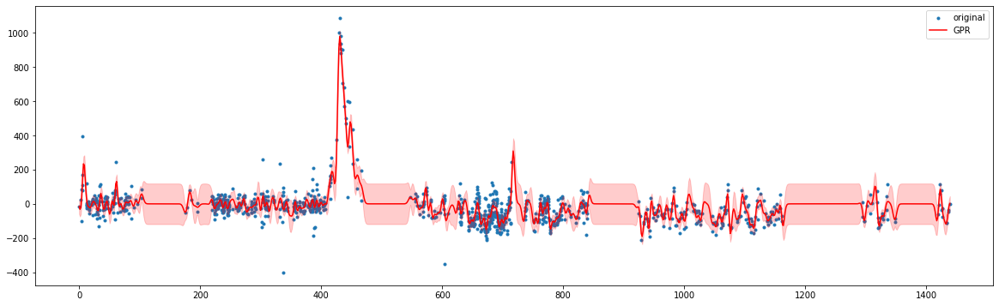

In [513]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.scatter(X, y, marker='.', label="original")
ax.plot(ts, y_pred, c='r', label='GPR')
ax.fill_between(ts, y_pred[:, 0] - dy_pred, y_pred[:, 0] + dy_pred, color='r', alpha=0.2)
plt.legend()

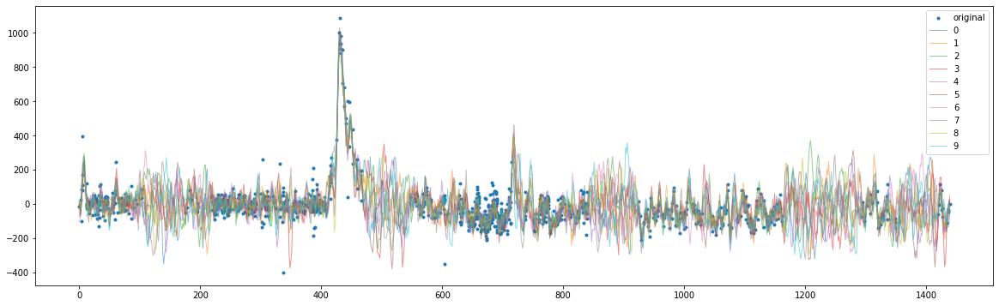

In [383]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.scatter(X, y, marker='.', label="original")
nsamples = 10
samples = np.array(gpr.sample_y(ts[:, np.newaxis], nsamples))
for i in range(nsamples):
    ax.plot(ts, samples[:, :, i], alpha=0.5, lw=1, label="%i" % i)
plt.legend()

## One-hot_encoder

Sometimes it is better to encode a categorial variable as a binary mask, specially for a neural network to read some data.

In [514]:
labels

oid
ZTF17aaaabrg    EB/EW
ZTF17aaaabtj      RRL
ZTF17aaaacml    EB/EW
ZTF17aaaacnc    RSCVn
ZTF17aaaacnt    EB/EW
                ...  
ZTF21abkjyui      RRL
ZTF21abkndcw      RRL
ZTF21abknlix      LPV
ZTF21abkrimu    EB/EW
ZTF21abkylyc      RRL
Name: classALeRCE, Length: 38951, dtype: object

In [96]:
pd.get_dummies(labels)

,AGN,Blazar,CV/Nova,Ceph,DSCT,EA,EB/EW,LPV,Periodic-Other,QSO,RRL,RSCVn,SNII,SNIa,SNIbc,YSO
oid,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
ZTF17aaaabtj,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
ZTF17aaaacml,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
ZTF17aaaacnc,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
ZTF17aaaacnt,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
ZTF21abkndcw,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
ZTF21abknlix,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


# Working with larger than memory data

You can use either partition your data or delay the calculation until really needed.

Some of the tools that may be useful are:

- Dask https://dask.org/
- PySpark https://spark.apache.org/docs/latest/api/python/
- Partition the data and process in a distributed fashion

See video from the Astroinformatics course in https://www.youtube.com/playlist?list=PL1ruHFLWTUoQT-3rCfCh-ikSR4xs7s6l5

# Loading data into Tensorflow and pytorch

Tensorflow and pytorch have special classes to read data from multiple files into precompiled datasets, or to store data in binary format for more efficient reading during training.

**Tensorflow**

![](images/tensorflow_csv.jpg)

![](images/tensorflow_read.jpg)

See:

https://www.tensorflow.org/api_docs/python/tf/data/Dataset

and 

https://github.com/jlaihong/Speed-up-Tensorflow-code-using-TFRecords for the difference between using TFRecords or not (https://www.youtube.com/watch?v=tk7cniyvH6c)

**Pytorch**

https://pytorch.org/docs/stable/data.html

See `Dataset` and `DataLoader` classes

In [515]:
# let's crete a random csv
df = pd.DataFrame(data=np.random.random((200, 10)), columns=[f'col_{i+1}' for i in range(10)])
df.to_csv("myfile.csv")
df

,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10
0,0.439582,0.283898,0.094271,0.976951,0.016847,0.235015,0.029533,0.235016,0.204807,0.570002
1,0.420068,0.240808,0.132121,0.330889,0.634907,0.890536,0.865858,0.929058,0.087790,0.013242
2,0.195020,0.395234,0.886033,0.876880,0.139125,0.004803,0.354674,0.470317,0.159745,0.991764
3,0.615871,0.456499,0.563359,0.819675,0.943860,0.320280,0.432868,0.153028,0.127533,0.795147
4,0.101915,0.617243,0.145349,0.150227,0.773509,0.501482,0.503604,0.845331,0.369409,0.363296
...,...,...,...,...,...,...,...,...,...,...
195,0.886465,0.135904,0.475665,0.536881,0.717157,0.501511,0.527819,0.081439,0.609568,0.019366
196,0.259449,0.109474,0.096878,0.284836,0.312081,0.570872,0.243902,0.569691,0.524043,0.092721
197,0.081804,0.615888,0.672274,0.939436,0.352366,0.033359,0.239626,0.471053,0.495807,0.327932
198,0.255798,0.292286,0.607731,0.589538,0.285868,0.201338,0.897526,0.790314,0.160192,0.287216


In [516]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import math

class MDSDataset(Dataset):
    
    def __init__(self):
        
        # read data (X, y) into torch tensor
        xy = np.loadtxt('myfile.csv', delimiter=',', skiprows=1)
        self.x = torch.from_numpy(xy[:, 1:])
        self.y = torch.from_numpy(xy[:, [0]]) # nsamples, 1
        self.nsamples = xy.shape[0]
        
    def __getitem__(self, index):
        
        return self.x[index], self.y[index]
    
    def __len__(self):
        
        return self.nsamples

dataset = MDSDataset()
batch_size = 4
dataloader = DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, num_workers=2)

num_epochs = 2
total_samples = len(dataset)
n_iterations = math.ceil(total_samples / batch_size)

for epoch in range(num_epochs):
    for i, (inputs, labels) in enumerate(dataloader):
        if (i + 1) % 5 == 0:
            print(f'epoch {epoch+1}/{num_epochs}, step {i+1}/{n_iterations}, inputs {inputs.shape}')


epoch 1/2, step 5/50, inputs torch.Size([4, 10])
epoch 1/2, step 10/50, inputs torch.Size([4, 10])
epoch 1/2, step 15/50, inputs torch.Size([4, 10])
epoch 1/2, step 20/50, inputs torch.Size([4, 10])
epoch 1/2, step 25/50, inputs torch.Size([4, 10])
epoch 1/2, step 30/50, inputs torch.Size([4, 10])
epoch 1/2, step 35/50, inputs torch.Size([4, 10])
epoch 1/2, step 40/50, inputs torch.Size([4, 10])
epoch 1/2, step 45/50, inputs torch.Size([4, 10])
epoch 1/2, step 50/50, inputs torch.Size([4, 10])
epoch 2/2, step 5/50, inputs torch.Size([4, 10])
epoch 2/2, step 10/50, inputs torch.Size([4, 10])
epoch 2/2, step 15/50, inputs torch.Size([4, 10])
epoch 2/2, step 20/50, inputs torch.Size([4, 10])
epoch 2/2, step 25/50, inputs torch.Size([4, 10])
epoch 2/2, step 30/50, inputs torch.Size([4, 10])
epoch 2/2, step 35/50, inputs torch.Size([4, 10])
epoch 2/2, step 40/50, inputs torch.Size([4, 10])
epoch 2/2, step 45/50, inputs torch.Size([4, 10])
epoch 2/2, step 50/50, inputs torch.Size([4, 10])
